# Text to Speech

When solving some problem with deep learning in practice, you search the Web for the latest paper that solves that task, and take its implementation from GitHub. However, often there is no code, so being able to **reimplement a paper** is a vital skill. You will likely have to do it in your course project, and we are going to practice it in this assignment.

Let's focus on the task of text-to-speech (**TTS**) synthesis.

![](https://user-images.githubusercontent.com/9570420/81783573-392ed600-9504-11ea-98da-86ac05457c29.png)

## Data

 Intuitively, in the real world your dataset would be a set of pairs:

* text (string);
* **target**: raw audio of a person saying `text` (array of amplitude values sampled e.g. 44100 times per second — see an example plotted above).

We give you a simplified problem statement, with one dataset sample being an utterance described by

* list of [ARPAbet phonemes](http://www.speech.cs.cmu.edu/cgi-bin/cmudict#phones);
* *phoneme alignment*, i.e. start time (frame) and duration for each phoneme;
* **target**: [mel spectrogram](https://pytorch.org/audio/transforms.html#torchaudio.transforms.MelSpectrogram) of a person saying text.

![image](https://user-images.githubusercontent.com/9570420/81795777-2a9cea80-9515-11ea-99eb-05915f803af1.png)

In [0]:
import scipy.io.wavfile
import os
import torch
import numpy as np
from IPython import display
from matplotlib import pyplot as plt
%matplotlib inline

import random
from pathlib import Path

seed = 0

random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.backends.cudnn.deterministic = True

In [6]:
# Detect if we are in Google Colaboratory
try:
    import google.colab
    IN_COLAB = True
except ImportError:
    IN_COLAB = False

from pathlib import Path
# Determine the locations of auxiliary libraries and datasets.
# `AUX_DATA_ROOT` is where 'notmnist.py', 'animation.py' and 'tiny-imagenet-2020.zip' are.
if IN_COLAB:
    google.colab.drive.mount("/content/drive")
    
    # Change this if you created the shortcut in a different location
    AUX_DATA_ROOT = Path("/content/drive/My Drive/HW4_COPY")
    
    assert AUX_DATA_ROOT.is_dir(), "Have you forgotten to 'Add a shortcut to Drive'?"
    
    import sys
    sys.path.insert(0, str(AUX_DATA_ROOT))
else:
    AUX_DATA_ROOT = Path(".")

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [7]:
![ ! -d "LJ-Speech-aligned" ] && unzip -q "{AUX_DATA_ROOT.parent / 'LJ-Speech-aligned.zip'}"
!git clone --recursive https://github.com/shrubb/waveglow.git -b denoiser-fix
!wget -c https://api.ngc.nvidia.com/v2/models/nvidia/waveglow_ljs_256channels/versions/2/files/waveglow_256channels_ljs_v2.pt

Cloning into 'waveglow'...
remote: Enumerating objects: 3, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 179 (delta 0), reused 2 (delta 0), pack-reused 176
Receiving objects: 100% (179/179), 433.68 KiB | 7.74 MiB/s, done.
Resolving deltas: 100% (98/98), done.
Submodule 'tacotron2' (https://github.com/shrubb/tacotron2.git) registered for path 'tacotron2'
Cloning into '/content/waveglow/tacotron2'...
remote: Enumerating objects: 399, done.        
remote: Total 399 (delta 0), reused 0 (delta 0), pack-reused 399        
Receiving objects: 100% (399/399), 2.69 MiB | 21.88 MiB/s, done.
Resolving deltas: 100% (202/202), done.
Submodule path 'tacotron2': checked out 'ed0f02bda932e6ab17f8f4b034ac26767a6a7a50'
--2020-05-24 18:29:51--  https://api.ngc.nvidia.com/v2/models/nvidia/waveglow_ljs_256channels/versions/2/files/waveglow_256channels_ljs_v2.pt
Resolving api.ngc.nvidia.com (api.ngc.nvidia.com)... 35.161.182.61, 52.89.201.137


Use this Python module to handle our dataset. It's documented, so when in doubt, use `help()` or read the code with `??lj_speech`.

In [8]:
pip install git+https://github.com/shrubb/listener.git

  Cloning https://github.com/shrubb/listener.git to /tmp/pip-req-build-t_3eqb4e
  Running command git clone -q https://github.com/shrubb/listener.git /tmp/pip-req-build-t_3eqb4e
  Created wheel for listener: filename=listener-1.0.0a1-cp36-none-any.whl size=87098 sha256=2558072162dc281c61b4a0b5e05d7f410591a13b00d0aa53c27cc2431973af5c
  Stored in directory: /tmp/pip-ephem-wheel-cache-lxxq85jx/wheels/41/ec/98/7c89227ba5da35ff1e7d5284bb58e0b98e93389fc1f77c407b
Successfully built listener


In [0]:
import lj_speech

In [0]:
??lj_speech

In [0]:
DATASET_ROOT = Path('LJ-Speech-aligned/')

train_dataset, val_dataset = lj_speech.get_dataset(DATASET_ROOT)

There are also a couple of useful constants, check them with `?lj_speech`.

In [10]:
len(train_dataset)

12971

In [0]:
#lj_speech.POSSIBLE_PHONEME_CODES

In [11]:
len(lj_speech.POSSIBLE_PHONEME_CODES)

54

Here is an example datapoint:

Datasets yield: text, phonemes_start, phonemes_duration, phonemes_code, spectrogram


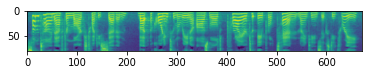

In [28]:
example_datapoint = train_dataset[666]
print(f"Datasets yield: {', '.join(example_datapoint.keys())}")
plt.imshow(example_datapoint['spectrogram']);

To "play" spectrograms, including those that you will generate, we will use another deep learning algorithm called [WaveGlow](https://arxiv.org/abs/1811.00002). It converts mel spectrograms to audio.

Fortunately, there *is* code for it on GitHub, so you won't have to reimplement it 🙂 Still, if you haven't done so, I encourage you to watch a short [video](https://www.youtube.com/watch?v=CqFIVCD1WWo) about a famous paper that it's based on.

In [0]:
vocoder = lj_speech.Vocoder()

In [30]:
print(example_datapoint['text'])

example_spectrogram = torch.from_numpy(example_datapoint['spectrogram'])
audio = vocoder(example_spectrogram)
lj_speech.play_audio(audio)

sometime after march twenty-seven, but according to marina oswald, prior to april ten, nineteen sixty-three,


Finally, we have phonemes as inputs, but we'd like to synthesize arbitrary text. For that, there is a function `lj_speech.text_to_phonemes(text)`.

## Method

Reimplement the baseline method defined by the diagram below. It's derived from a simplified version of the [DurIAN paper](https://arxiv.org/abs/1909.01700).

Just in case, here are some of the most notable differences from DurIAN:
* Prosodic boundary markers aren't used (we don't have them labeled), and thus there's no 'skip states' exclusion of prosodic boundaries' hidden states.
* Style codes aren't used too (same).
* Simpler network architectures.
* No pre-net in decoder.
* No attention used in decoder.
* Decoder's recurrent cell outputs single spectrogram frame at a time.
* Decoder's recurrent cell isn't conditioned on its own outputs (isn't "autogressive").

![pipeline](https://user-images.githubusercontent.com/9570420/81863803-6f0ba300-9574-11ea-9f02-481c2bba81f0.png)

This picture is the simplified Figure 1 from the paper. **Use the paper as a reference**. If something is unclear from the diagram — and, in fact, some things are intentionally omitted — search answers in the paper (but remain aware of the differences/simplifications in the above diagram) and other papers that the authors cite. There will even be details that aren't even mentioned anywhere in the paper, so you'll have to guess by your intuition. For instance, DurIAN paper doesn't explain batch size and sampling strategy, and even if it did, it would be irrelevant since we use different data. Finally, search the Web and read others' code; however, if you copy-paste code, **cite it**.

Tips:
* Only compute loss on the 'original' parts of the spectrograms (don't include padding)!
* When using recurrent nets, [clip gradients' norm](https://pytorch.org/docs/stable/nn.html#torch.nn.utils.clip_grad_norm_).
* Since you will use recurrent nets, and the sequences in a batch will be of different lengths, you may find [sequence packing utility](https://stackoverflow.com/questions/51030782/why-do-we-pack-the-sequences-in-pytorch) useful.
* Remember that you can send images and audio into TensorBoard, too.

**Train this baseline so that the words are well-recognizable, and try to get rid of the "metallic", "tin sounding" voice.**

**Aim for something like this:**

In [0]:
lj_speech.play_audio(scipy.io.wavfile.read(AUX_DATA_ROOT / 'ok.wav')[1])

**On the other hand, here is an example of insufficient quality:**

In [0]:
lj_speech.play_audio(scipy.io.wavfile.read(AUX_DATA_ROOT / 'bad.wav')[1])

## Improving the Method

When you have the baseline working, seek the ways to improve quality and to decrease loss. Look into the paper and the relevant/neighbouring literature. Also, follow your intuition, e.g. for changing model complexity or regularization. For example, you can (but aren't obliged to) try borrowing more tricks from DurIAN; a couple of examples for inspiration:

* Make decoder recurrent cell autoregressive as in the paper: use its output as its input at the next preiction step.
* Add pre-net to decoder.
* Add attention to decoder.
* Use more complex sub-network architectures (e.g. use CBHG).
* Employ tricks from Tacotron {[1](https://arxiv.org/abs/1703.10135),[2](https://arxiv.org/abs/1712.05884)} — papers that DurIAN is based upon, e.g. [zoneout](https://arxiv.org/abs/1606.01305) in RNNs.

Write a report on your journey to better loss. Explain if you managed to perceptibly improve the quality and lower the loss, what you tried and why, what worked and what didn't. Include TensorBoard loss plots.

## Deliverables

1. This file, fully functional, reproducing all the reported results on "Run all". Out-of-the box `TextToSpeechSynthesizer` class (see interface below) and demo code of running it on arbitrary text.
2. Report on improving the baseline at the end of this file.
3. Two "checkpoint files" with weights for both of your models (baseline and the improved model).

## Grading

* **[7 points]** Baseline.
* **[3 points]** Improving of the baseline.

In [0]:
import torch
from torch import nn
import torch.nn.functional as F
from datetime import datetime
from torch.utils.tensorboard import SummaryWriter
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
import gc
gc.collect()
torch.cuda.empty_cache()

###DATA PREPARATION

In [12]:
#################### GET_DATASET APPROPRIATELY ###########################
class get_data(Dataset): 
  def __init__(self,phonemes_data):
    self.phonemes_data = phonemes_data
  def __len__(self):
    phonemes_len = len(self.phonemes_data)
    return phonemes_len 
  def __getitem__(self,idx):
    return self.phonemes_data


phoneme_codes = sorted(lj_speech.POSSIBLE_PHONEME_CODES)
list_phoneme = ['<___>'] + phoneme_codes
len_ = len(list_phoneme)
print("phonme list : ", len_)

phonme list :  55


In [13]:
ph_seq_max = 0
spec_max = 0
for i in (train_dataset):
  ph_seq_max = max(ph_seq_max,len(i['phonemes_code']))
  spec_max = max(spec_max,i['spectrogram'].shape[1])


print("Phoneme_Max : ", ph_seq_max)
print("spectogram_Max : ", spec_max)

Phoneme_Max :  137
spectogram_Max :  870


In [0]:
def func_collate(batch):
    phonemes =     []
    phoneme_len =  []
    spectrograms = [] 
    durations =    []
   
    max_ph_seq = 137
    max_spec_len = 870
    get_ph_id = {ph: id_  for id_, ph in enumerate(list_phoneme)}
    for i in batch:

        spec = i['spectrogram']
        spec_padd = np.pad(spec,[(0, 0),(0,max_spec_len - spec.shape[1])],mode="constant", constant_values=0)
        spectrograms.append(spec_padd)
        
        ph_dur = i['phonemes_duration']
        ph_dur = np.pad(ph_dur, (0,max_ph_seq-len(ph_dur)),mode='constant', constant_values=0)
        durations.append(ph_dur)

        ph_cd = i['phonemes_code']
        ph_cd = [get_ph_id[ph_id] for ph_id in ph_cd]  #get phoneme id from phoneme code
        phoneme_len.append(len(ph_cd))
        
        ph_cd = np.pad(ph_cd, (0,max_ph_seq-len(ph_cd)),mode='constant', constant_values=0)
        phonemes.append(ph_cd)
        

    spectrograms = torch.FloatTensor(spectrograms)
    durations = torch.LongTensor(durations)
    phonemes = torch.LongTensor(phonemes)
    phoneme_len = torch.LongTensor(phoneme_len)
    

    return [phonemes, spectrograms, durations, phoneme_len]

In [15]:
train_loader = DataLoader(train_dataset, batch_size=64, 
                          shuffle=True, collate_fn=func_collate)


val_loader = DataLoader(val_dataset, batch_size=64, 
                          shuffle=True, collate_fn=func_collate)

print(len(train_loader)) 
print(len(val_loader))

203
2


###Module

In [0]:
############################### ENCODER MODULE ##################################

class Conv_layer(nn.Module):
    def __init__(self, in_, out_,p):
        super(Conv_layer,self).__init__()
        self.conv_1 = nn.Conv1d(in_,out_,5,padding=2)
        self.conv_2 = nn.Conv1d(in_,out_,1)
        self.relu  = nn.ReLU()
        self.dropout = nn.Dropout(p=p)
        self.BN = nn.BatchNorm1d(out_)

    def forward(self,x):
      out_1 = self.dropout(self.BN(self.relu(self.conv_1(x))))
      out_2 = self.conv_2(x)
      conv_out = out_1 + out_2
      return conv_out


class Encoder(nn.Module):
    def __init__(self, in_,out_):
        super(Encoder, self).__init__()
        self.phoneme_Embed = nn.Embedding(in_,out_)  #in_ == vocab_size, embedding_size = out_ = 256
        #Conv_layer
        self.conv_layers_merged = nn.Sequential(
            Conv_layer(out_,out_,0.5),           #256 output channels : out_ == in_ == embedding size = 256
            Conv_layer(out_,out_,0.5),           #256 output channels : 
            Conv_layer(out_,2*out_,0.5),         #512 output channels: out_2
            Conv_layer(2*out_,2*out_,0.5),       #512 output channels: out_2
            Conv_layer(2*out_,2*out_,0.5)        #512 output channels: out_2
          )    
        self.rnn = nn.GRU(2*out_,out_,batch_first=True, bidirectional=True) #INPUT & OUTPUT: (batch, seq, feature)
           
    def forward(self, x):
        x = self.phoneme_Embed(x)                  #get embeddings|| x == phonemes
        x = torch.transpose(x,1,2)
        x = self.conv_layers_merged(x)             #encode
        x = torch.transpose(x,1,2)
        enc_out, hid_state = self.rnn(x)           #enc_out == (seq_len, batch, num_directions * hidden_size):  == (batch, seq, feature).
        return enc_out                             #hid_state == ( ) 


############################################### Duration_model ###########################################################
# class Duration_model(nn.Module):
#     def __init__(self, phon_emb,emb_size):
#         super(Duration_model,self).__init__()
#         #self.emb_size = phon_emb.shape[1]
#         self.phoneme_Embed = nn.Embedding(emb_size,emb_size)        #pHONEMES EMBEDDING, embedding_size = out_ = 256
#         self.lstm = nn.LSTM(emb_size,512,3,                         #INPUT & OUTPUT: (batch, seq, feature) || num_layers == 3 
#                             batch_first=True, bidirectional=True)
#         self.dense = nn.Linear(2*512,1)           #[bs, num_features]
#         self.phoneme_Embed.weight = nn.Parameter(self.phon_emb)   #phon_emb == embedding_weight
       
#     def forward(self,x):
#        x = self.phoneme_Embed(x) 
#        lstm_out, hid_state = self.lstm(x)
#        duration_out = self.dense(lstm_out)
#        duration_out = duration_out.view(-1,137)
#        return  duration_out

########################################## AlignModule ################################################################
class AlignModule(nn.Module):
  def __init__(self):
    super(AlignModule,self).__init__()

  def forward(self,enc_out,dur):
    device = enc_out.device
    phoneme_rep_align =[]
    for i,j in enumerate(enc_out):    #for each state inteh encoder_output(phoneme_rep)
      j = torch.repeat_interleave(j,dur[i],0)
      get_duration= []
      
      for _ in dur[i]:     
        get_duration.append(torch.linspace(0.0,1.0,_,device=device))
      get_duration = torch.cat(get_duration).unsqueeze(-1)
      alingn_features = [j,get_duration]
      j = torch.cat(alingn_features,1)
      j = F.pad(j,(0,0,0,870-j.shape[0]))
      phoneme_rep_align.append(j.unsqueeze(0))
    phoneme_rep_align = torch.cat(phoneme_rep_align,0)
    return phoneme_rep_align  


############################################  Decoder ##############################################################
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder,self).__init__()
      ##########POST_NET#############################################
        #self.emb_size = emb_size
        self.post_net = nn.Sequential(
            Conv_layer(256,513,0.0),      #256 output channels : out_ == in_ == embedding size = 256
            Conv_layer(513,256,0.0), #256 output channels : 
            Conv_layer(256,256,0.0), #256 output channels: out_2
            Conv_layer(256,256,0.0), #256 output channels: out_2
            Conv_layer(256,256,0.0)  #256 output channels: out_2
          )   

           
      ################################################################### 
        self.conv_postnet = nn.Conv1d(256,80,1)
        self.Gru = nn.GRU(513,256,2,batch_first=True)    #out_ = 256, num_layers= 2 
        self.conv_Gru = nn.Conv1d(256,80,1)              #conv_1d, kernel_size = 1
           
    def forward(self, align_OUT):
        x,_ = self.Gru(align_OUT)   
        GRU_pred_spec = self.conv_Gru(x.transpose(1,2))  
        x_post_net = self.post_net(x.transpose(1,2))
        POST_pred_spec = self.conv_postnet(x_post_net)
        return GRU_pred_spec, POST_pred_spec

################################COMBINING MODULES TOGETHER###################################
class Simplified_DurIAN(nn.Module):
  def __init__(self):
    super(Simplified_DurIAN,self).__init__()
    self.encoder = Encoder(55,256)
    self.decoder = Decoder()
    self.alignment = AlignModule()

  def forward(self,phonemes,durations):
    enc_out = self.encoder(phonemes)      #encoding the phonemes....
    align_out = self.alignment(enc_out,durations)  #I pass encpder_output + durations into the alignment
    GUR_spec,POST_NET_spec = self.decoder(align_out)
    return  GUR_spec,POST_NET_spec

In [0]:
#model_sample = Simplified_DurIAN()

In [0]:
#GUR_spec_1,POST_NET_spec_2 = model_sample(i[0],duration)

In [0]:
#POST_NET_spec_2.shape

In [0]:
#GUR_spec_1.shape

torch.Size([64, 80, 870])

In [0]:
# true_spec = i[1]
# true_spec.shape

In [0]:
#mask = (true_spec != 0)

In [0]:
#mask.shape

In [0]:
#GUR_spec_1[mask].shape

In [0]:
#true_spec[mask].shape

In [0]:
#GUR_spec_1.

In [0]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = Simplified_DurIAN().to(device)
criterion = nn.L1Loss()                      #to minimize the L1 loss
optimizer =torch.optim.Adam(model.parameters(),lr=1e-4)


import tqdm
from tqdm import trange
num_epoch = 30         ####1st training epochs...(11)

In [22]:
model.load_state_dict(torch.load('Simplified_DurIAN.best.pth'))


<All keys matched successfully>

In [0]:
model.load_state_dict(torch.load('Simplified_DurIAN.best.pth'))
num_epoch = 20       #2nd training epoch.......

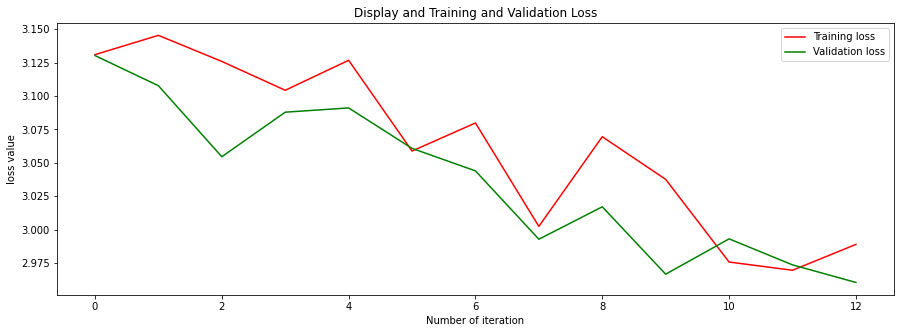



 65%|██████▌   | 13/20 [1:00:37<32:15, 276.51s/it]



Training Loss:  tensor(2.9889, device='cuda:0', grad_fn=<AddBackward0>)
Validation Loss:  tensor(2.9605, device='cuda:0', grad_fn=<AddBackward0>)


RuntimeError: ignored

In [0]:
# def train_model(model):
#   train_loss = 0 
#   val_loss = 0
#   best_val_loss = float('+inf')
#   train_loss_curve=[]
#   val_loss_curve=[]
 
#   for epoch in trange(num_epoch): 
#     model.train()
#     for i in train_loader:
#       input_phonemes =  i[0].to(device)
#       true_spectogram = i[1].to(device)
#       input_durations = i[2].to(device)
     
#       GRU_spec,POSTNET_spec = model(input_phonemes,input_durations)
#       pad_mask = (true_spectogram != 0)
#       loss_1 = criterion(true_spectogram[pad_mask],GRU_spec[pad_mask])
#       loss_2 = criterion(true_spectogram[pad_mask],POSTNET_spec[pad_mask])
#       train_loss = loss_1 + loss_2
#       optimizer.zero_grad()
#       train_loss.backward()
#       optimizer.step()

#       train_loss += train_loss.cpu().detach().item()
#     train_loss/len(train_loader)
#     train_loss_curve.append(train_loss)
#     ################################################
#     model.eval()
#     for j in val_loader:
#       input_phonemes =  j[0].to(device)
#       true_spectogram = j[1].to(device)
#       input_durations = j[2].to(device)

#       pad_mask = (true_spectogram != 0)
    
#       GRU_spec,POSTNET_spec = model(input_phonemes,input_durations)
#       valloss_1 = criterion(true_spectogram[pad_mask],GRU_spec[pad_mask])
#       valloss_2 = criterion(true_spectogram[pad_mask],POSTNET_spec[pad_mask])
#       val_loss = valloss_1 + valloss_2
#       val_loss += val_loss.cpu().detach().item()

#       if val_loss < best_val_loss:
#           best_val_loss = val_loss
#           torch.save(model.state_dict(),'checkpoint.pth')

#     val_loss/len(val_loader)
#     val_loss_curve.append(val_loss)

#     #del val_loss
#     #del train_loss
#     gc.collect()
#     torch.cuda.empty_cache()
#     display.clear_output(wait=True)
  
#     plt.figure(figsize=(15,5))
#     plt.plot(train_loss_curve, 'r', label ='Training loss')
#     plt.plot(val_loss_curve, 'g', label ='Validation loss')
#     plt.xlabel('Number of iteration')
#     plt.ylabel('loss value')
#     plt.title('Display and Training and Validation Loss')
#     plt.legend(loc = 'best')
#     plt.show()
#     print('\n')
#     print("Training Loss: " , train_loss)
#     print("Validation Loss: " ,val_loss)

# train_model(model)    

- Ran out of CUDA for the 2nd time...

- I reload the checkpoint and trained again (for the 3rd time)

In [0]:
def setup_experiment(title, logdir="./tb"):
    experiment_name = "{}@{}".format(title, datetime.now().strftime("%d.%m.%Y-%H:%M:%S"))
    writer = SummaryWriter(log_dir=os.path.join(logdir, experiment_name))
    best_model_path = f"{title}.best.pth"
    return writer, experiment_name, best_model_path


def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [0]:
model.load_state_dict(torch.load('Simplified_DurIAN.best.pth'))
num_epoch = 10       #3rd training epoch.......

In [0]:

writer, experiment_name, best_model_path = setup_experiment(model.__class__.__name__, logdir="./tb")
print(f"Experiment name: {experiment_name}")

print(f"Model has {count_parameters(model):,} trainable parameters")

Experiment name: Simplified_DurIAN@24.05.2020-07:04:56
Model has 9,713,316 trainable parameters


In [0]:
def run_epoch(model,iterator, optimizer, criterion, phase='train', epoch=0, writer=None):
  is_train = (phase == 'train')
  if is_train:
    model.train()
  else:
    model.eval()

  loss = 0
  with torch.set_grad_enabled(is_train):
    for i in iterator:
       input_phonemes =  i[0].to(device)
       true_spectogram = i[1].to(device)
       input_durations = i[2].to(device)

       GRU_spec,POSTNET_spec = model(input_phonemes,input_durations)
       pad_mask = (true_spectogram != 0)
       loss_1 = criterion(true_spectogram[pad_mask],GRU_spec[pad_mask])
       loss_2 = criterion(true_spectogram[pad_mask],POSTNET_spec[pad_mask])
       loss = loss_1 + loss_2
       if is_train:
          optimizer.zero_grad()
          loss.backward()
          optimizer.step()
        
       loss += loss.item()
    if writer is not None:
      writer.add_scalar(f"loss_epoch/{phase}", loss/len(iterator), epoch)
    return loss/len(iterator)

In [0]:
#num_epochs = 50
best_val_loss = float('+inf')

for epoch in trange(num_epoch):
  train_loss = run_epoch(model,train_loader,optimizer, criterion, phase='train',epoch=epoch, writer=writer)
  val_loss =  run_epoch(model,val_loader, None, criterion, phase='val', epoch=epoch, writer=writer)
    

  if val_loss < best_val_loss:
    best_val_loss = val_loss
    torch.save(model.state_dict(),best_model_path)

  print(f'Epoch: {epoch+1:02}')
  print(f'\tTrain Loss: {train_loss:.3f}')
  print(f'\tVal Loss: {val_loss:.3f}')





  0%|          | 0/10 [00:00<?, ?it/s]



 10%|█         | 1/10 [04:36<41:28, 276.45s/it]

Epoch: 01
	Train Loss: 0.014
	Val Loss: 1.464






 20%|██        | 2/10 [09:11<36:49, 276.13s/it]

Epoch: 02
	Train Loss: 0.014
	Val Loss: 1.449






 30%|███       | 3/10 [13:46<32:09, 275.60s/it]

Epoch: 03
	Train Loss: 0.014
	Val Loss: 1.465






 40%|████      | 4/10 [18:20<27:31, 275.33s/it]

Epoch: 04
	Train Loss: 0.014
	Val Loss: 1.452






 50%|█████     | 5/10 [22:51<22:49, 273.99s/it]

Epoch: 05
	Train Loss: 0.014
	Val Loss: 1.467






 60%|██████    | 6/10 [27:26<18:16, 274.23s/it]

Epoch: 06
	Train Loss: 0.014
	Val Loss: 1.457






 70%|███████   | 7/10 [31:59<13:41, 273.76s/it]

Epoch: 07
	Train Loss: 0.014
	Val Loss: 1.460






 80%|████████  | 8/10 [36:32<09:06, 273.50s/it]

Epoch: 08
	Train Loss: 0.014
	Val Loss: 1.450






 90%|█████████ | 9/10 [41:06<04:33, 273.70s/it]

Epoch: 09
	Train Loss: 0.014
	Val Loss: 1.469






100%|██████████| 10/10 [45:41<00:00, 274.15s/it]

Epoch: 10
	Train Loss: 0.014
	Val Loss: 1.432


In [0]:
%load_ext tensorboard
%tensorboard --logdir ./tb

Output hidden; open in https://colab.research.google.com to view.

In [0]:
best_model_path

'Simplified_DurIAN.best.pth'

In [63]:
model.load_state_dict(torch.load('Simplified_DurIAN.best.pth'))

<All keys matched successfully>

In [0]:
for i in range(1): 
  for i in train_loader:
    break
test_set = i

In [49]:
len(test_set)

4

In [0]:
phonemes =  test_set[0]
spectrograms = test_set[1]
durations = test_set[2]
phoneme_lengths = test_set[3]

In [0]:
spect_arr = spectrograms.detach().clone().to("cpu").numpy()[0]

In [52]:
#print(example_datapoint['text'])
example_spectrogram = torch.from_numpy(spect_arr)
audio = vocoder(example_spectrogram)
lj_speech.play_audio(audio)

In [0]:
GRU_spec1,POSTNET_spec2 = model(phonemes.to(device),durations.to(device))

In [0]:
spec_pred_arr = GRU_spec1.detach().clone().to("cpu").numpy()[0]

In [55]:
example_spectrogram = torch.from_numpy(spec_pred_arr)
audio = vocoder(example_spectrogram)
lj_speech.play_audio(audio)

In [66]:
encoder =  Encoder(55,256)
encoder.phoneme_Embed.weight.shape[1]

256

####Building and Training of the Duration Model

In [0]:
#################Training the Duration Model#############################
class Duration_model(nn.Module):
    def __init__(self):
        super(Duration_model,self).__init__()
        self.phoneme_Embed = nn.Embedding(55,256)        #pHONEMES EMBEDDING, embedding_size = out_ = 256
        self.lstm = nn.LSTM(256,512,3,                         #INPUT & OUTPUT: (batch, seq, feature) || num_layers == 3 
                            batch_first=True, bidirectional=True)
        self.dense = nn.Linear(2*512,1)           #[bs, num_features]
        #self.embedding = nn.Embedding(55,256)
       
    def forward(self,x):
       x = self.phoneme_Embed(x) 
       lstm_out, hid_state = self.lstm(x)
       duration_out = self.dense(lstm_out)
       duration_out = duration_out.view(-1,137)
       return  duration_out

In [0]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_Dur = Duration_model().to(device)
state_i = model.encoder.phoneme_Embed.weight.clone().detach().to(device)
model_Dur.phoneme_Embed.weight = nn.Parameter(state_i)
criterion_Dur = nn.MSELoss()
optimizer_Dur = torch.optim.Adam(model_Dur.parameters(),lr=1e-4)

In [0]:
class DurationModel(nn.Module):
    def __init__(self, vocab_size=len(phoneme_vocab),
                 embedding_size=256,
                 lstm_num_hidden=512,
                 max_phonemes_seq_size=MAX_PHONEMES_SEQ_SIZE):
        super(DurationModel, self).__init__()
        self.vocab_size = vocab_size
        self.embedding_size = embedding_size
        self.lstm_num_hidden = lstm_num_hidden
        self.max_phonemes_seq_size = max_phonemes_seq_size

        self.embedding = nn.Embedding(vocab_size, self.embedding_size)
        
        self.lstm = nn.LSTM(self.embedding_size, lstm_num_hidden, num_layers=3, batch_first=True, bidirectional=True)
        self.fc = nn.Linear(lstm_num_hidden*2, 1)
    
    def forward(self, x):
        x = self.embedding(x)
        y, _ = self.lstm(x)
        return self.fc(y).view(-1, self.max_phonemes_seq_size)

In [60]:
writer, experiment_name, best_model_path = setup_experiment(model_Dur.__class__.__name__, logdir="./tb")
print(f"Experiment name: {experiment_name}")

print(f"Model has {count_parameters(model_Dur):,} trainable parameters")

Experiment name: Duration_model@24.05.2020-19:17:59
Model has 15,768,321 trainable parameters


In [0]:
def run_dur_epoch(model,iterator,optimizer, criterion, phase='train', epoch=0, writer=None):
  is_train = (phase == 'train')
  if is_train:
    model.train()
  else:
    model.eval()

  loss = 0
  with torch.set_grad_enabled(is_train):
    for i in iterator:
       input_phonemes =  i[0].to(device)
       input_durations = i[2].to(device)

       output_durations = model(input_phonemes)
       loss = criterion(input_durations,output_durations)
       if is_train:
          optimizer.zero_grad()
          loss.backward()
          optimizer.step()
        
       loss += loss.item()
    if writer is not None:
      writer.add_scalar(f"loss_epoch/{phase}", loss/len(iterator), epoch)
    return loss/len(iterator)

In [73]:
best_model_path

'Duration_model.best.pth'

In [77]:
best_val_loss = float('+inf')

for epoch in trange(5):
  train_loss = run_dur_epoch(model_Dur,train_loader,optimizer_Dur, criterion_Dur, phase='train',epoch=epoch, writer=writer)
  val_loss =  run_dur_epoch(model_Dur,val_loader, None, criterion_Dur, phase='val', epoch=epoch, writer=writer)
    

  if val_loss < best_val_loss:
    best_val_loss = val_loss
    torch.save(model.state_dict(),'Duration_model.best.pth')

  print(f'Epoch: {epoch+1:02}')
  print(f'\tTrain Loss: {train_loss:.3f}')
  print(f'\tVal Loss: {val_loss:.3f}')


 20%|██        | 1/5 [02:04<08:17, 124.26s/it]

Epoch: 01
	Train Loss: 0.046
	Val Loss: 4.006



 40%|████      | 2/5 [04:07<06:12, 124.06s/it]

Epoch: 02
	Train Loss: 0.036
	Val Loss: 3.886



 60%|██████    | 3/5 [06:11<04:07, 123.84s/it]

Epoch: 03
	Train Loss: 0.033
	Val Loss: 3.555



 80%|████████  | 4/5 [08:14<02:03, 123.70s/it]

Epoch: 04
	Train Loss: 0.043
	Val Loss: 3.682



100%|██████████| 5/5 [10:17<00:00, 123.42s/it]

Epoch: 05
	Train Loss: 0.035
	Val Loss: 3.243


In [0]:
model_Dur.load_state_dict(torch.load("Duration_model.best.pth"))

In [81]:
%load_ext tensorboard
%tensorboard --logdir ./tb

Output hidden; open in https://colab.research.google.com to view.

####Attepmt on Improvement.

- I will be using idea from Tacotron to make attempts towards improving my model.

In [0]:
# class HighNet(nn.Module):
#     def __init__(self, in_, out_):
#         super(HighNet, self).__init__()
#         self.fc = nn.Linear(in_,out_)
#         self.fc.bias.data.zero_()
#         self.fc_2 = nn.Linear(in_,out_)
#         self.fc_2.bias.data.fill_(-1)
#         self.relu = nn.ReLU()
#         self.sigmoid = nn.Sigmoid()

#     def forward(self, x):
#         out_1 = self.fc(x)
#         out_1 = self.relu(out_1)
#         out_2 = self.fc_2(x)
#         out_2 = self.sigmoid(out_2)
#         out_12 = out_1 * out_2 
#         high_out = out_12 + x * (1.0-out_2)
#         return high_out


# class BNConv1d(nn.Module):
#     def __init__(self, in_, out_, kernel_, get_activation=None, momen=0.99,e=1e-3 ):
#         super(BNConv1d, self).__init__()
#         self.conv1d = nn.Conv1d(in_, out_,kernel_size=kernel_, 
#                   stride=stride, padding=padding, bias=False)
#         self.BN = nn.BatchNorm1d(out_,momentum=momen, eps=e)
#         self.active  = get_activation

#     def forward(self, x):
#         x = self.conv1d(x)
#         x = self.active(x) if self.active is not None else x
#         x = self.BN(x)
#         return x


# class CBHG(nn.Module):
    
#     def __init__(self,in_, K=16, sizes_=[128, 128]):
#         super(CBHG, self).__init__()
#         self.in_ = in_ 
#         self.relu = nn.ReLU() 
#         self.gru = nn.GRU(in_,in_,1,batch_first=True, bidirectional=True)
#         self.highNet_layers = nn.ModuleList([HighNet(in_, in_) for i in range(4)])
#         self.highNet_dense = nn.Linear(sizes_[-1], in_, bias=False)
#         self.conv_layers = nn.ModuleList([BNConv1d(in_,in_,16,1,8,
#                       get_activation=self.relu,momen=0.99,e=1e-3)
#         for k in range(1,17)])
#         in_sizes = [K * in_] + sizes_[:-1]
#         activations = [self.relu] * (len(sizes_) - 1) + [None]
#         self.conv1d_layers = nn.ModuleList(
#                 [BatchNormConv1d(in_, out_,3,1,1,
#                 get_activation=a,momen=0.99,e=1e-3)
#                 for in_, out_, a in zip(in_sizes,sizes_,activations)])


#      def forward(self, ph_in, x_length=None):
#         #assert x.size(-1) == self.in_dim
#         x = ph_in
#         x = x.transpose(1, 2)
#         last_value = x.size(-1)
#         x = torch.cat([i(x)[:, :, :last_value] for i in self.conv_layers], dim=1)
#         #assert x.size(1) == self.in_dim * len(self.conv_layers)
#         for j in self.conv1d_layers
#             x = j(x)
#         x = self.highNet_dense(x.transpose(1, 2))
#         x += ph_in
#         for nets in self.highNet_layers:
#             x = nets(x)
#         if x_length is not None:
#             x = nn.utils.rnn.pack_padded_sequence(x,x_length,batch_first=True, enforce_sorted=False)
#         GRu_out, hidden = self.gru(x)
#         if x_length is not None:
#             GRu_out, hidden = nn.utils.rnn.pad_packed_sequence(y,batch_first=True)
#         return GRu_out


# class Encoder(nn.Module):
#     def __init__(self, vocab_size, embedding_size,
#                  prenet_hiddens=[256],
#                  gbhg_hiddens=[256, 512],
#                  dropout_rate=0.5):
#         super(Encoder, self).__init__()

#         self.vocab_size = vocab_size
#         self.embedding_size = embedding_size
#         self.prenet_hiddens = prenet_hiddens
#         self.gbhg_hiddens = gbhg_hiddens
#         self.dropout_rate = dropout_rate


#         self.embedding = nn.Embedding(self.vocab_size, self.embedding_size)
#         #Prenet
#         in_sizes = [self.embedding_size] + self.prenet_hiddens[:-1]
#         prenet_layers = [nn.Linear(in_size, out_size)
#                          for in_size, out_size in zip(in_sizes, self.prenet_hiddens)]
#         self.prenet = nn.Sequential(
#             *prenet_layers,
#             nn.ReLU(),
#             nn.Dropout(self.dropout_rate)
#         )
        
#         self.gbhg = CBHG(self.prenet_hiddens[-1], K=5, hidden_sizes=self.gbhg_hiddens)

#     def forward(self, phonemes, x_length=None):
#         x = self.embedding(phonemes)
#         x = self.prenet(x)
#         x = self.gbhg(x, x_length)
#         return x            


In [30]:
get_ph_id = {ph: id_  for id_, ph in enumerate(list_phoneme)}
len(get_ph_id)

55

In [33]:
ph_seq_max

137

In [0]:
encoder =  Encoder(55,256)
emb_W = encoder.phoneme_Embed.weight.clone().detach()
emb_W

In [0]:
class TextToSpeechSynthesizer:
    """
    When done, please fill this class. It should work out-of-the-box, i.e.
    have a simple interface, automatically load model weights,
    process text to speech at one command without errors etc.
    """
    def __init__(self, checkpoint_model,checkpoint_duration, model_type="Simplified_DurIAN", device=torch.device('cpu')):
        self.device = device
        
        if model_type == 'Simplified_DurIAN':

            self.model = Simplified_DurIAN()
            self.model.load_state_dict(torch.load(checkpoint_model))
            self.model.eval().to(device)

            self.Duration_model = Duration_model()
            self.Duration_model.load_state_dict(torch.load(checkpoint_duration)) 
            self.Duration_model.eval().to(device)

            
        else:
            raise Exception("use mode='default' ")
        
    
    def synthesize_from_text(self, text):
        
        phonemes = lj_speech.text_to_phonemes(text)
        return self.synthesize_from_phonemes(phonemes)

    def synthesize_from_phonemes(self, phonemes, durations=None):
        get_ph_id = {ph: id_  for id_, ph in enumerate(list_phoneme)}
        phonemes = [get_ph_id[ph_id] for ph_id in phonemes]
        phonemes = np.pad(phonemes, (0,ph_seq_max-len(phonemes)),mode='constant',constant_values=0)
        phonemes = torch.LongTensor(phonemes).unsqueeze(0).to(self.device)

        if durations is None:
            durations = self.Duration_model(phonemes)
            durations = torch.round(durations)
            durations[durations < 0] = 0
            durations = durations.long()
        else:
            durations = np.pad(durations,(0,ph_seq_max-len(durations)),
                               mode='constant',constant_values=0)
            durations = torch.LongTensor([durations])

        input_phonemes = phonemes.to(device)
        input_durations = durations.to(device)
        spectrogram, _= self.model(input_phonemes,input_durations)
        spectrogram = spectrogram[0][:, :durations.sum()].cpu().detach()
        return vocoder(spectrogram)

In [48]:
# Example:
synthesizer = TextToSpeechSynthesizer("Simplified_DurIAN.best.pth","Duration_model.best.pth", model_type="Simplified_DurIAN", device=torch.device('cpu'))
#synthesizer = TextToSpeechSynthesizer("./baseline.pth", <any-other-arguments>)

RuntimeError: ignored

In [0]:
phonemes = "DH IH1 S pau pau pau IH1 Z pau pau pau S P AH1 R T AH1 AH1 AH1 pau".split()
lj_speech.play_audio(
    synthesizer.synthesize_from_phonemes(phonemes))

In [0]:
text = "Pack my box with five dozen liquor jugs."
# text = "The five boxing wizards jump quickly."
# text = "The quick brown fox jumps over the lazy dog."
# text = "How about some school tech."
# text = "Last homework. We are in a deep trouble. No sleep tonight."

lj_speech.play_audio(
    synthesizer.synthesize_from_text(text))

Summary of My Journey...

- Dear TA,

- I firstly consulted the DurIAN , TACOTRON and TACOTRON 2 papers before stating my implementation.

- I built the model according to the schematic diagrams  given in this notebook and details from the DURIAN paper.

- I was a bit successful in the implementation of the "Simplified_DurIAN" model after 40 training epochs that was done severally due to the "CUDA failure issues"

- I then made implementation of the "Duration_Model" as described in theu schematic diagram as well.

- Furthermore, I  made attempts towards improving the "baseline" model, by adding PRENET, HIGHWAYS AND CBGH modules to teh encoder as I learnt from the TACOTRON paper to improve my model, but I was not success in this task.

- However in my attempt of bringing all these different modules together into the "TEXTTOSPEECHSYNTHESIZER", I encountered a very strange error about loading of my duration model weight back into my model.

- I tried re-training my Duration model and re-loading but this error persist.

- Unfortunately, I encountered a rather stranger error of "model_state" not being compatible with my "model_keys".


- I do not not have enough time to crack this out.

- Thank you so much for the privilege of the great lessons from this homework